# Deep Dream

Здесь демонстрируется интересная технология Deep Dream, созданная Google. Основной ее смысл -- просмотр паттернов, на которые сильнее всего активируются сверточные слои нейронной сети. Идея состоит в следующем: будем изменять исходное изображение так, чтобы на него увеличивалась активациая выбранного нами слоя.

Загрузим используемые библиотеки.

In [1]:
import torch
import torch.nn as nn
from torchvision import models, transforms
import numpy as np

import matplotlib.pyplot as plt
%matplotlib inline

from PIL import Image, ImageFilter, ImageChops
from urllib.request import urlopen
import io

В качестве модели будем использовать предобученный vgg19.

In [2]:
vgg = models.vgg19(pretrained=True)
print(vgg)

Downloading: "https://download.pytorch.org/models/vgg19-dcbb9e9d.pth" to /root/.cache/torch/hub/checkpoints/vgg19-dcbb9e9d.pth



VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace=True)
    (16): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), pad

Опишем класс DeepDream, который принимает изображание, исследуемую модель, а так же устройство, на котором она будет работь (cpu или gpu). 

Здесь описана функция инициализации, она прнимет описанные выше параметры и сохраняет изображение в необходимоv для работы vgg19 формате.

Функция toImage переводит изображение в изначальный формат.

In [3]:
class DeepDream:
    def __init__(self, image, model, device):
        self.image = image
        self.imgSize = 224
        self.device = device

        self.model = model.to(self.device)
        self.modules = list(self.model.features.modules())
        
        self.mean = torch.Tensor([0.485, 0.456, 0.406]).to(self.device)
        self.std = torch.Tensor([0.229, 0.224, 0.225]).to(self.device)
        
        self.transformPreprocess = transforms.Compose([
            transforms.Resize((self.imgSize, self.imgSize)),
            transforms.ToTensor(),
            transforms.Normalize(mean=self.mean, std=self.std)
        ])

    def toImage(self, image):
        return image * self.std + self.mean


Функция deepDream реализует основную логику алогритма:
1. Пропустим изображение через все слои до необходимого нам.
1. Объявим переменную loss, которая равна $L_2$-норме выхода выбранного слоя.
1. С помощью loss.backward() посчитам градиент loss'a по исходному изображению и сделаем шаг, в сторону его увеличения.

Такими действиями мы изменияем исходную картинку, для получение максимальной активации сверточного слоя. После нескольких итераций на изображении будут появлятся паттерны, активирующие данный слой.

In [4]:
class DeepDream(DeepDream):
    def deepDream(self, image, layer, iter, lr):
        transformed = self.transformPreprocess(image).unsqueeze(0).to(self.device)
        input_img = torch.autograd.Variable(transformed, requires_grad=True)
        
        self.model.zero_grad()
        for _ in range(iter):
            out = input_img
            for layer_id in range(layer):
                out = self.modules[layer_id + 1](out)

            loss = out.norm()
            loss.backward()
            input_img.data = input_img.data + lr * input_img.grad.data

        input_img = input_img.data.squeeze().transpose(0, 1).transpose(1, 2)
        input_img = np.clip(self.toImage(input_img).cpu(), 0, 1)
        return Image.fromarray(np.uint8(input_img * 255))

Но нам недостаточно просто применить deepDream к картинке, потому что паттерны, которые учит слой очень маленькие по размеру отноительно самой картинки, поэтому будем действовать по схеме на рисунке:
<img src="https://cdn-images-1.medium.com/max/2400/1*SFgIqRXLDE03_sUWNnxFzQ.png" width="800">

In [5]:
class DeepDream(DeepDream):
    def deepDreamRecursive(self, image, layer, iter, lr, num_downscales=10):
        if num_downscales == 0:
            img_result = self.deepDream(image, layer, iter, lr)
            img_result = img_result.resize(image.size)
            return img_result
        
        image_small = image.filter(ImageFilter.GaussianBlur(2))
        
        small_size = (int(image.size[0]/2), int(image.size[1]/2))
        if (small_size[0] == 0 or small_size[1] == 0):
            small_size = image.size
        image_small = image_small.resize(small_size, Image.ANTIALIAS)

        image_small = self.deepDreamRecursive(image_small, layer, iter, lr, num_downscales-1)
        image_large = image_small.resize(image.size, Image.ANTIALIAS)
        image = ImageChops.blend(image, image_large, 0.5)

        img_result = self.deepDream(image, layer, iter, lr)
        img_result = img_result.resize(image.size)
        return img_result

    def deepDreamProcess(self, num_layer, num_iter, lr, num_downscales):
        return self.deepDreamRecursive(self.image, num_layer, num_iter, lr, num_downscales)

Объявем константы:
1. NUM_ITERATIONS -- количество изменений изображения, можно интерпретировать как интенсивность применения алгоритма. 
1. LR -- learning rate.
1.  NUM_DOWNSCALES -- количество уменьшений размерности изображения.

In [6]:
NUM_ITERATIONS = 5
LR = 0.2
NUM_DOWNSCALES = 10

device = torch.device('cuda:0') if torch.cuda.is_available() else torch.device('cpu')

Опишем функцию для вывода результата работы алгоритма.

In [7]:
def make_deepDream(image, model, layer_id):
    img_deep_dream = DeepDream(image, model, device).deepDreamProcess(layer_id, NUM_ITERATIONS, LR, NUM_DOWNSCALES)
    f, ax = plt.subplots(figsize=(10, 10))
    ax.imshow(img_deep_dream.resize((512, 512), Image.ANTIALIAS))
    plt.show()

Возьмем кратинку из интернета.

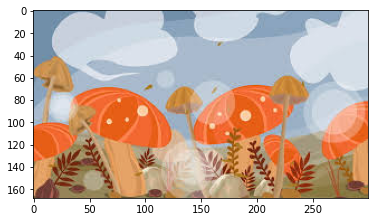

In [8]:
URL = 'https://encrypted-tbn0.gstatic.com/images?q=tbn:ANd9GcQ5npD51Jt1Y5-96ylTGefk6Ul8kRdBocVVMg&usqp=CAU'
img = Image.open(io.BytesIO(urlopen(URL).read()))
plt.imshow(img)

Посмотрим паттерны, на которые реагируют некоторые слои сети.

Deep Dream on 2 layer


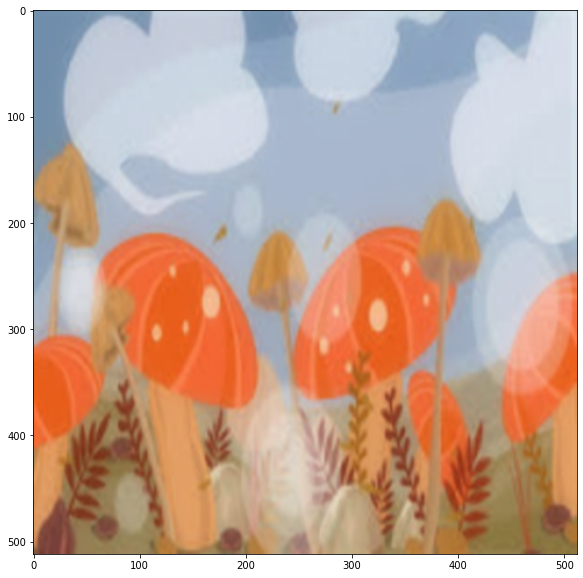

Deep Dream on 5 layer


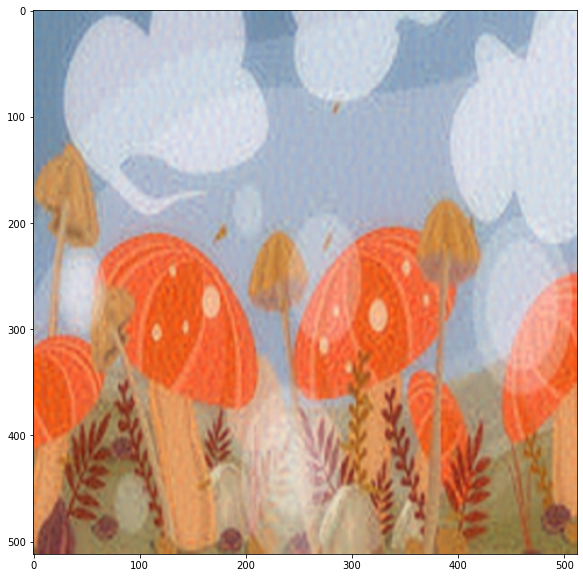

Deep Dream on 10 layer


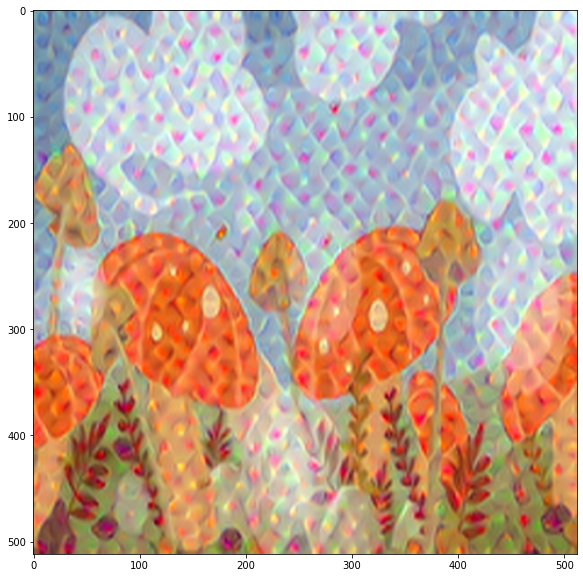

Deep Dream on 19 layer


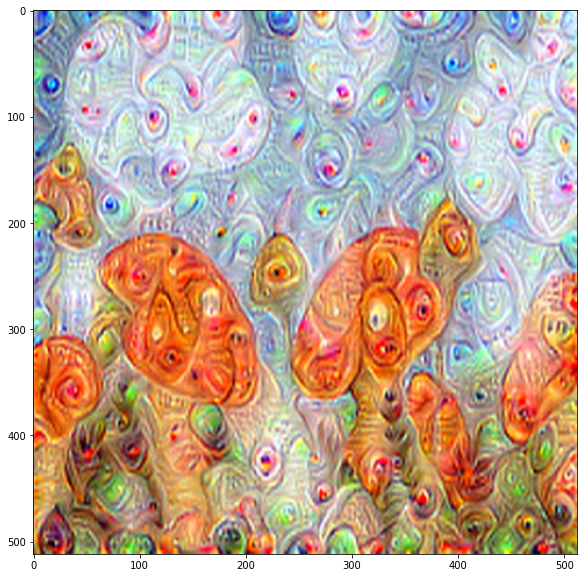

Deep Dream on 25 layer


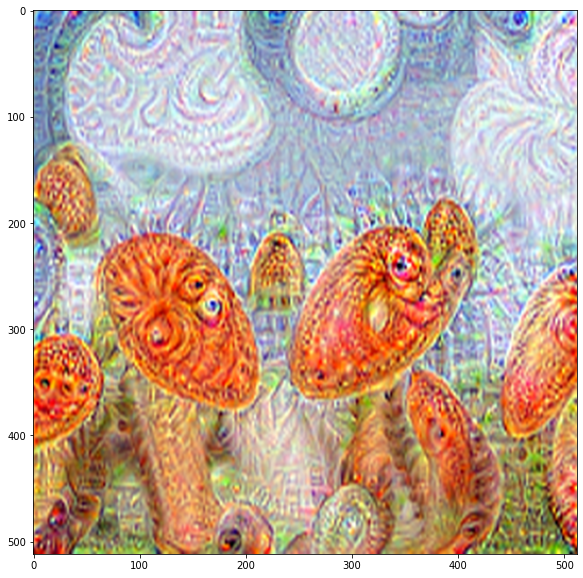

Deep Dream on 32 layer


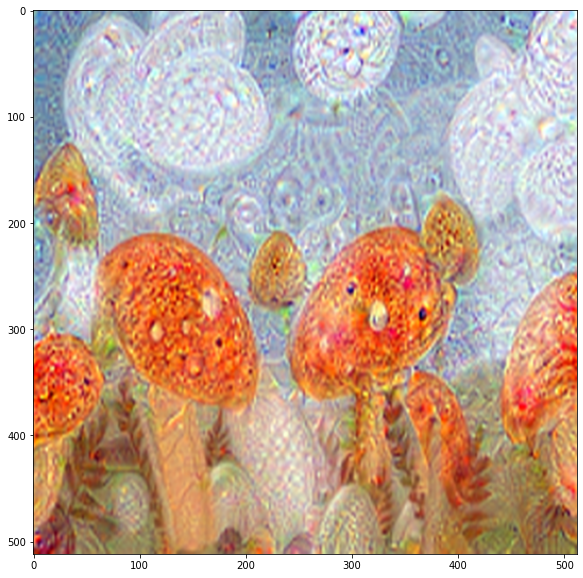

In [9]:
layers = [2, 5, 10, 19, 25, 32]
for i in layers:  
    print('Deep Dream on {} layer'.format(i))
    make_deepDream(img, vgg, i)

Посмотрим на преобразование белого изображения.

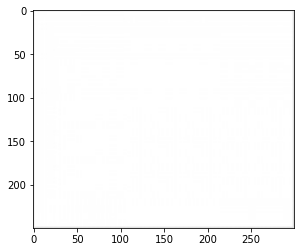

In [10]:
URL = 'https://www.meme-arsenal.com/memes/70b3bdcd191255d20b5a13ebf08edb91.jpg'
white_img = Image.open(io.BytesIO(urlopen(URL).read()))
plt.imshow(white_img)

Deep Dream on 2 layer


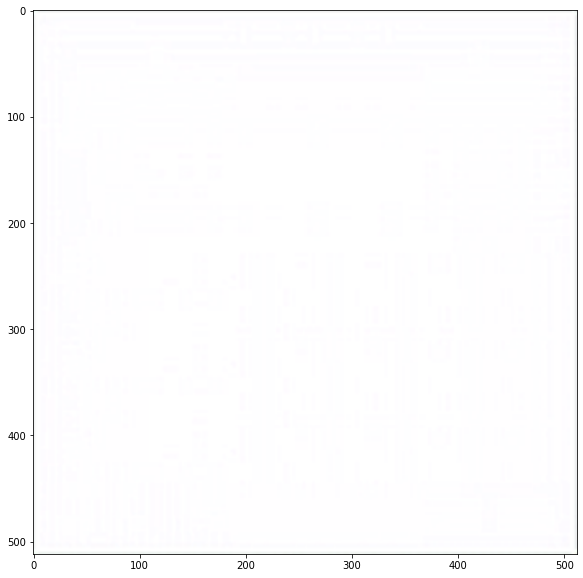

Deep Dream on 5 layer


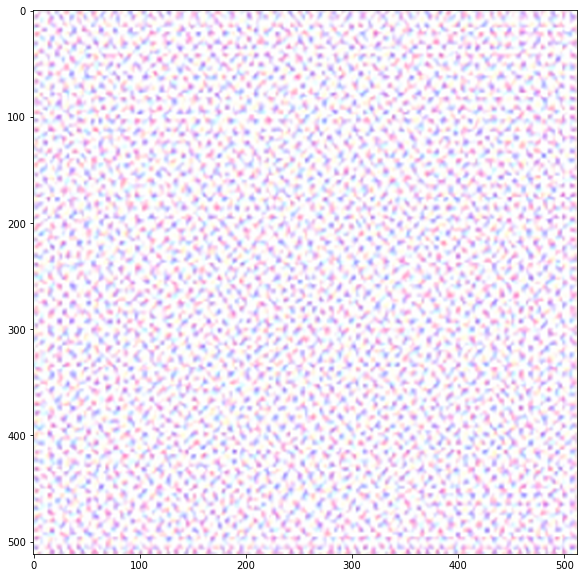

Deep Dream on 10 layer


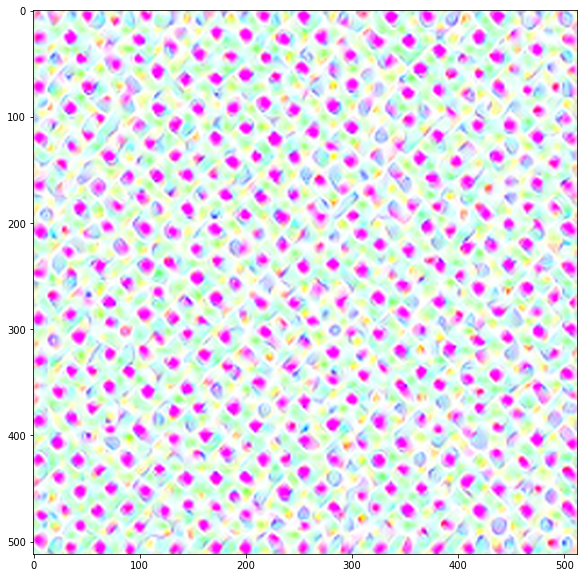

Deep Dream on 19 layer


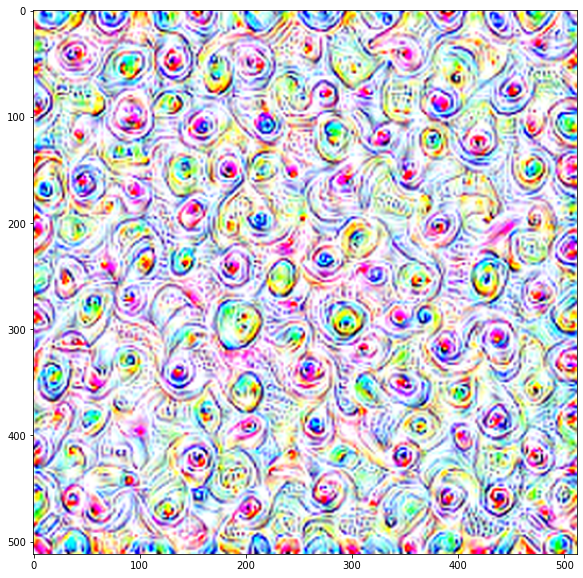

Deep Dream on 25 layer


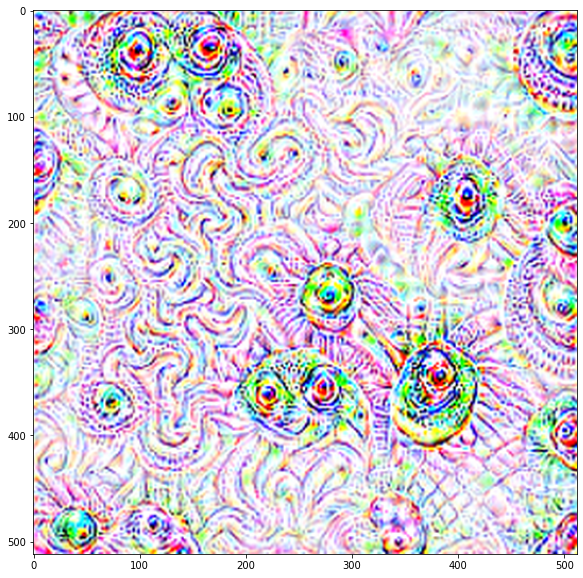

Deep Dream on 32 layer


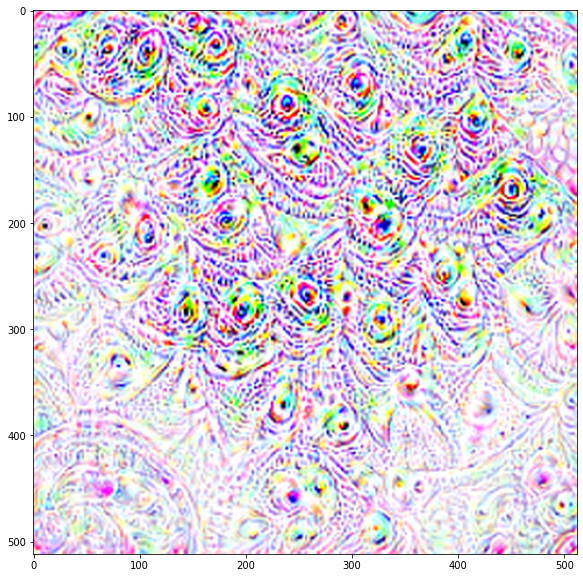

In [11]:
NUM_ITERATIONS = 10
for i in layers:  
    print('Deep Dream on {} layer'.format(i))
    make_deepDream(white_img, vgg, i)

Посмотрим на преобразования случейного изображения

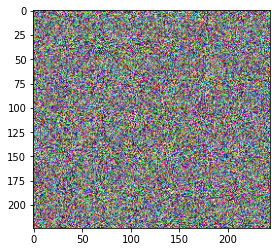

In [12]:
random_img = np.random.randn(224, 244, 3)
random_img = Image.fromarray(np.uint8(random_img * 255))
plt.imshow(random_img)

Deep Dream on 2 layer


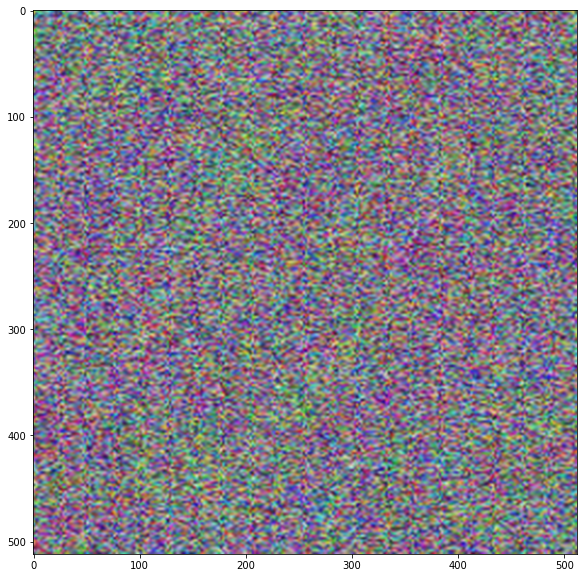

Deep Dream on 5 layer


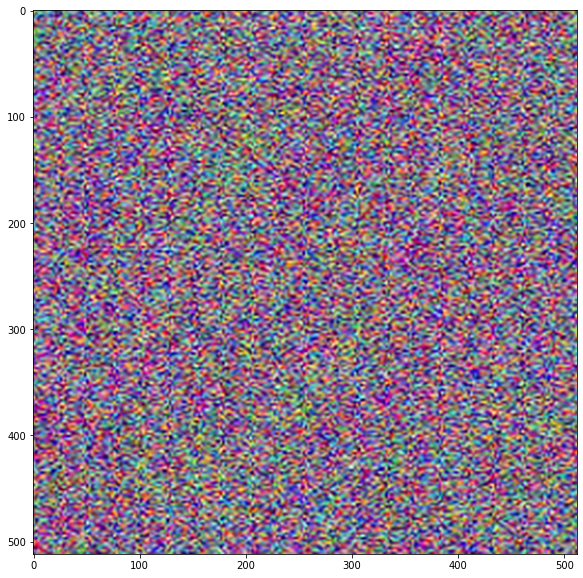

Deep Dream on 10 layer


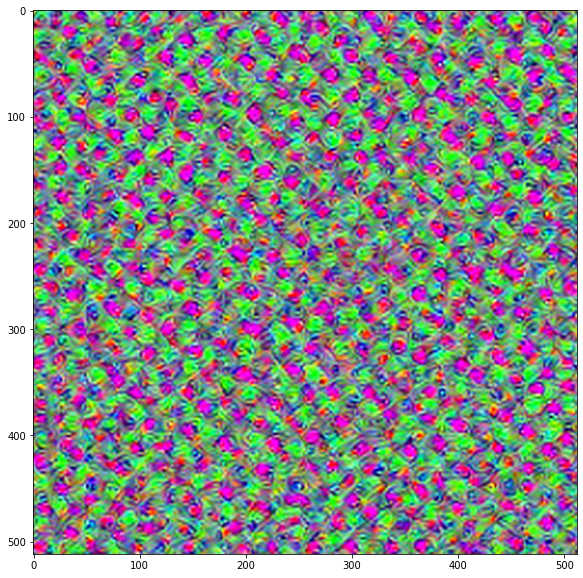

Deep Dream on 19 layer


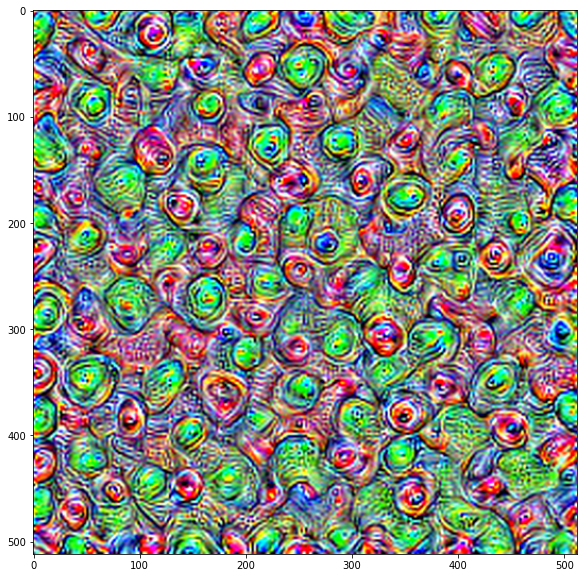

Deep Dream on 25 layer


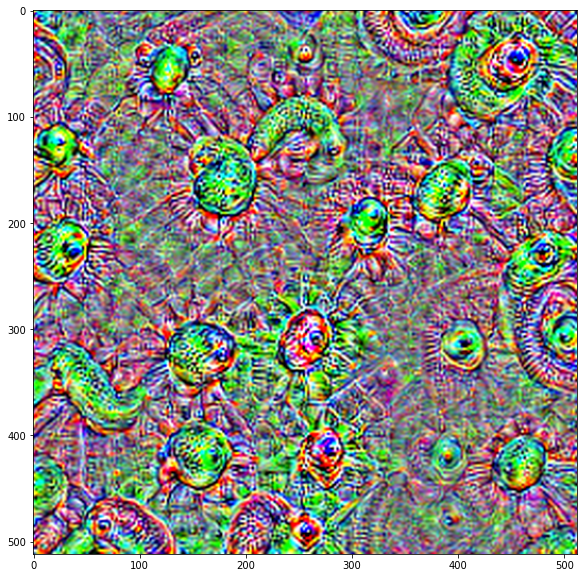

Deep Dream on 32 layer


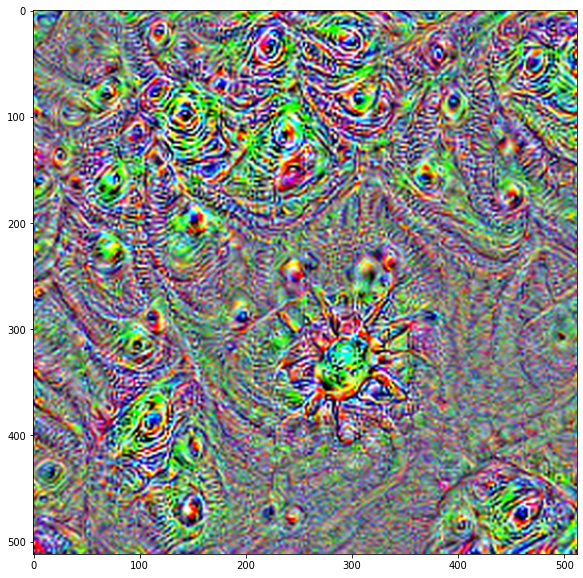

In [13]:
for i in layers:  
    print('Deep Dream on {} layer'.format(i))
    make_deepDream(random_img, vgg, i)